# EDA z uwzględnieniem czynnika przestrzennego

### IMPORTY BIBLIOTEK

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

### INFORMACJE O DANYCH

In [76]:
data = pd.read_excel(r"C:\Users\User\Desktop\Downloads\who_aap_2021_v9_11august2022.xlsx", sheet_name = "AAP_2022_city_v9")
data.head(5)

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Reference,Number and type of monitoring stations,Version of the database,Status
0,Eastern Mediterranean Region,AFG,Afghanistan,Kabul,2019,119.77,NaN,NaN,18.0,NaN,NaN,"U.S. Department of State, United States Enviro...",NaN,2022,NaN
1,European Region,ALB,Albania,Durres,2015,NaN,17.65,26.63,NaN,NaN,83.961187,European Environment Agency (downloaded in 2021),NaN,2022,NaN
2,European Region,ALB,Albania,Durres,2016,14.32,24.56,24.78,NaN,NaN,87.932605,European Environment Agency (downloaded in 2021),NaN,2022,NaN
3,European Region,ALB,Albania,Elbasan,2015,NaN,NaN,23.96,NaN,NaN,97.853881,European Environment Agency (downloaded in 2021),NaN,2022,NaN
4,European Region,ALB,Albania,Elbasan,2016,NaN,NaN,26.26,NaN,NaN,96.049636,European Environment Agency (downloaded in 2021),NaN,2022,NaN


### ITABLES

In [78]:
from itables import show
show(data)

Itables pozwala na wyświetlenie wybranej liczby rekordów dla danych, na wpisanie szukanej wartości wpisując w pole 'Search'. Wnosi wartość użytkową w tym rodzaju danych, pozwala na wstępne przeglądanie i zapoznanie się z danymi

In [4]:
data.describe()

,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Version of the database,Status
count,32191.000000,15048.000000,21109.000000,22200.000000,7275.000000,5381.000000,19890.000000,32191.000000,0.0
mean,2015.579354,22.920320,30.533252,20.619336,90.794096,90.583500,93.696804,2021.744214,NaN
std,2.752654,17.925906,29.312756,12.133388,14.872681,13.816311,10.451751,1.051897,NaN
min,2000.000000,0.010000,1.040000,0.000000,0.000000,2.568493,1.923077,2016.000000,NaN
25%,2014.000000,10.350000,16.980000,12.000000,88.595890,87.945205,93.207763,2022.000000,NaN
50%,2016.000000,16.000000,22.000000,18.800000,97.000000,96.039000,96.369863,2022.000000,NaN
75%,2018.000000,31.000000,31.300000,27.160000,99.000000,98.938000,98.926941,2022.000000,NaN
max,2021.000000,191.900000,540.000000,210.680000,100.000000,100.000000,100.000000,2022.000000,NaN


In [5]:
data.columns

Index(['WHO Region', 'ISO3', 'WHO Country Name', 'City or Locality',
       'Measurement Year', 'PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference',
       'Number and type of monitoring stations', 'Version of the database',
       'Status'],
      dtype='object')

In [6]:
data.shape

(32191, 15)

### BRAKUJĄCE WARTOŚCI

In [7]:
missing_values = (data.isna().sum() / data.shape[0] * 100)

print("Procent brakujących wartości dla każdej kolumny:")
print(missing_values)

Procent brakujących wartości dla każdej kolumny:
WHO Region                                  0.003106
ISO3                                        0.000000
WHO Country Name                            0.000000
City or Locality                            0.000000
Measurement Year                            0.000000
PM2.5 (μg/m3)                              53.254015
PM10 (μg/m3)                               34.425771
NO2 (μg/m3)                                31.036625
PM25 temporal coverage (%)                 77.400516
PM10 temporal coverage (%)                 83.284148
NO2 temporal coverage (%)                  38.212544
Reference                                   0.015532
Number and type of monitoring stations     72.793638
Version of the database                     0.000000
Status                                    100.000000
dtype: float64


Można zaobserwować duże braki w istotnych kolumnach 'PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)', 'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)', 'NO2 temporal coverage (%)'. Kolumna 'Number and type of monitoring stations' również zawiera sporą ilość brakujących danych, bo aż około 73%, lecz nie wydaje się być szczególnie potrzebna w analizie. Kolumna 'Status' zawiera 100% brakujących wartości. Kolumny 'Reference' oraz 'WHO Region' zawierają nieznaczne braki. Być może uda się w dalszej analizie ustalić brak w kolumnie 'WHO Region', ponieważ jest ona powiązana z kolumną 'WHO Country Name' oraz 'City or Locality', gdzie braki w danych nie występują. Dla PM2.5 ponad połowa obserwacji zawiera brakujące wartości, dla pomiarów NO2 oraz PM10 około 30%.

In [8]:
data.isna().sum()

WHO Region                                    1
ISO3                                          0
WHO Country Name                              0
City or Locality                              0
Measurement Year                              0
PM2.5 (μg/m3)                             17143
PM10 (μg/m3)                              11082
NO2 (μg/m3)                                9991
PM25 temporal coverage (%)                24916
PM10 temporal coverage (%)                26810
NO2 temporal coverage (%)                 12301
Reference                                     5
Number and type of monitoring stations    23433
Version of the database                       0
Status                                    32191
dtype: int64

### USUNIĘCIE ZBĘDNYCH KOLUMN

In [9]:
data = data.drop(columns=["Status", "Version of the database", "Reference", "Number and type of monitoring stations"])


Zdecydowano się usunąć kolumny nieprzydatne w analizie takie jak: 'Reference', 'Number and type of monitoring stations', 'Status' oraz 'Version of the database'. Kolumnę 'Status' usunięto ze względu na 100% brakujących w niej wartości. Wersja bazy danych również została uznana na nieprzydatną w analizie zanieczyszczeń, analogicznie z dwiema pozostałymi kolumnami. 

In [10]:
duplicates = data[data.duplicated(keep=False)]
print(duplicates)

                   WHO Region ISO3 WHO Country Name City or Locality  \
236    Western Pacific Region  AUS        Australia            Perth   
237    Western Pacific Region  AUS        Australia            Perth   
1749   South East Asia Region  BGD       Bangladesh       Chittagong   
1750   South East Asia Region  BGD       Bangladesh       Chittagong   
3630          European Region  CHE      Switzerland           Avully   
...                       ...  ...              ...              ...   
28247         European Region  ROU          Romania        Baia Mare   
32079          African Region  ZAF     South Africa        Ethekwini   
32080          African Region  ZAF     South Africa        Ethekwini   
32083          African Region  ZAF     South Africa        Ethekwini   
32084          African Region  ZAF     South Africa        Ethekwini   

       Measurement Year  PM2.5 (μg/m3)  PM10 (μg/m3)  NO2 (μg/m3)  \
236                2019           6.84         12.58         9.09 

In [11]:
data = data.drop_duplicates()

Postanowiono usunąć duplikaty w danych, przez co pozbyto się 198 rekordów. Duplikaty powstały przez usunięcie kolumn nieprzeydatnych w analizie. 

### SPRAWDZANIE POWODU WYSTĘPOWANIA BRAKÓW 

In [12]:
data[data['WHO Region'].isna()]

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%)
24778,NaN,LIE,Liechtenstein,Vaduz,2010,NaN,17.88,23.59,NaN,96.164,98.265


W kolumnie 'WHO Region' występuje jeden brak wartości. Ze względu, że pozostała kolumna połączone z kolumną 'WHO Region', czyli: 'WHO Country Name' nie zawiera braków, brak ten można uzupełnić.

In [13]:
data['WHO Region'].unique()

array(['Eastern Mediterranean Region', 'European Region',
       'Region of the Americas', 'Western Pacific Region',
       'South East Asia Region', 'African Region', nan], dtype=object)

In [14]:
data['WHO Region'].fillna('European Region', inplace=True)

Biorąc pod uwagę unikalne wartości występujące w kolumnie 'WHO Region' zdecydowano się zastąpić brak w danych dla Liechtensteinu 'Eurpoean Region'.

In [15]:
data.isna().sum()

WHO Region                        0
ISO3                              0
WHO Country Name                  0
City or Locality                  0
Measurement Year                  0
PM2.5 (μg/m3)                 17083
PM10 (μg/m3)                  11076
NO2 (μg/m3)                    9987
PM25 temporal coverage (%)    24828
PM10 temporal coverage (%)    26732
NO2 temporal coverage (%)     12296
dtype: int64

In [16]:
data['Measurement Year'] = pd.to_datetime(data['Measurement Year'], format='%Y')
data.sort_values(by='Measurement Year', inplace=True)

In [17]:
record_count_by_year = data['Measurement Year'].dt.year.value_counts()

print("Liczba rekordów dla każdego roku:")
print(record_count_by_year)

Liczba rekordów dla każdego roku:
2018    5017
2019    4790
2016    4144
2017    3915
2015    3775
2014    3048
2010    2898
2013    2787
2012     846
2011     668
2020     165
2021      18
2001       3
2007       3
2006       3
2002       3
2000       3
2004       2
2003       2
2009       1
2008       1
Name: Measurement Year, dtype: int64


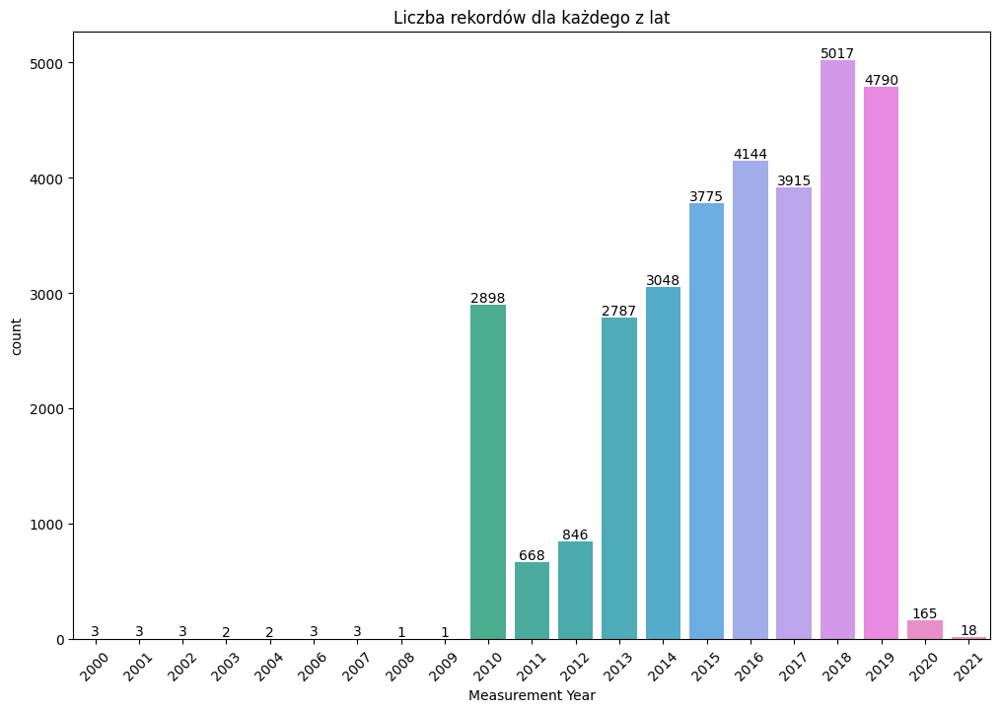

In [18]:
record_count_by_year_sorted = record_count_by_year.sort_index()

plt.figure(figsize=(12, 8))
ax = sns.countplot(data, x = data['Measurement Year'].dt.year)

ax.set_title("Liczba rekordów dla każdego z lat")
ax.tick_params(axis = "x", rotation = 45)
ax = ax.bar_label(ax.containers[0])

Jak widać, dla lat 2000-2009 występuje bardzo mała liczba rekordów - 1, 2, najczęściej 3. Podczas, gdy dla lat 2010-2019 rekordów tych jest znacznie więcej. Jednak widać zależność, że liczba pomiarów zaczyna maleć od 2020 roku, być może spowodowane to jest pandemią COVID-19.

In [19]:
data['PM10 (μg/m3)'].isnull().sum()

11076

In [20]:
data['PM2.5 (μg/m3)'].isnull().sum()

17083

In [21]:
nulls_together = (data['PM10 (μg/m3)'].isnull() & data['PM2.5 (μg/m3)'].isnull()).sum()

print("Liczba razem nulli w obu kolumnach:", nulls_together)

Liczba razem nulli w obu kolumnach: 4853


In [22]:
data.shape

(32092, 11)

Więcej brakujących wartości posiada kolumna PM2.5 niż PM10. Jednocześnie w obu kolumnach nany występują 4853 razy. Całość danych po zmianach zawiera 32092 rekordów. Być może brakujące wartości w kolumnach PM2.5 oraz PM10 mogą zostać zastąpione "sugerując się" wartościami z drugiej kolumny, ponieważ logika wskazuje, że powinna występować silna korelacja między tymi zmiennymi. Więc czysto teoretycznie bylibyśmy w stanie wyjaśnić 27234 rekordów.

In [23]:
32092 - 4858

27234

### ANALIZA KORELACJI

In [24]:
data.corr()

C:\Users\User\AppData\Local\Temp\ipykernel_3564\2627137660.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%)
PM2.5 (μg/m3),1.000000,0.873962,0.431206,-0.095904,-0.206926,-0.206112
PM10 (μg/m3),0.873962,1.000000,0.306495,-0.318712,-0.232154,-0.288267
NO2 (μg/m3),0.431206,0.306495,1.000000,-0.090998,0.007517,-0.027051
PM25 temporal coverage (%),-0.095904,-0.318712,-0.090998,1.000000,0.607854,0.339344
PM10 temporal coverage (%),-0.206926,-0.232154,0.007517,0.607854,1.000000,0.678591
NO2 temporal coverage (%),-0.206112,-0.288267,-0.027051,0.339344,0.678591,1.000000


C:\Users\User\AppData\Local\Temp\ipykernel_3564\1344606838.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, linewidth=.5)


<Axes: >

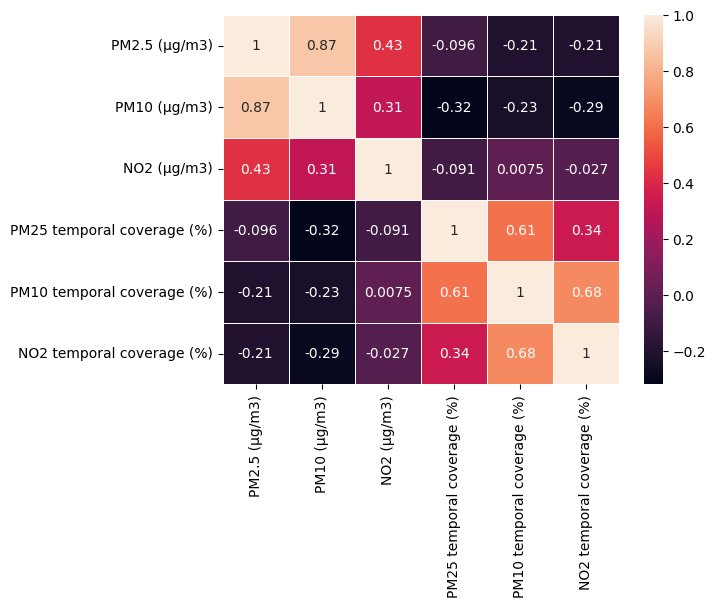

In [25]:
sns.heatmap(data.corr(), annot=True, linewidth=.5)

In [26]:
together = (data['PM10 (μg/m3)'].notnull() & data['PM2.5 (μg/m3)'].notnull()).sum()

print("Liczba razem uzupełnionych danych w obu kolumnach:", together)

Liczba razem uzupełnionych danych w obu kolumnach: 8786


Tak jak można się było spodziewać, na podstawie 8786 wartości występujących zarówno w kolumnie z wartościami PM10 jak i PM2.5 korelacja między tymi zmiennymi jest na wysokim poziomie, wynoszącym 87%. Z tego względu będzie możliwa 'łatwa' imputacja danych.

### WYKRESY

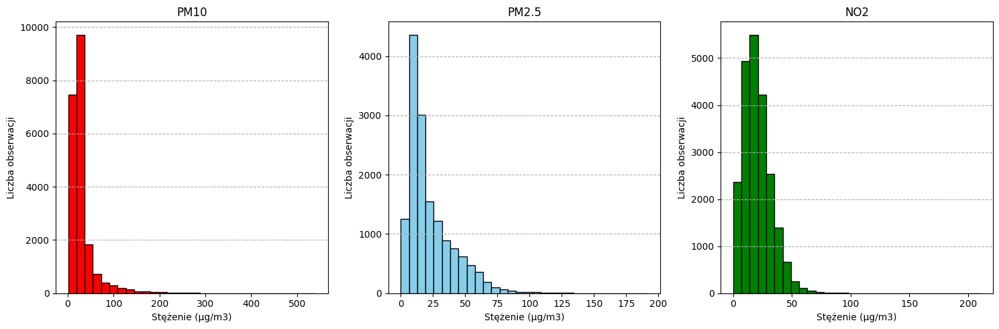

In [27]:
pm10_dane = data['PM10 (μg/m3)']
pm25_dane = data['PM2.5 (μg/m3)']
no2_dane = data['NO2 (μg/m3)']

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(pm10_dane, bins=30, color='red', edgecolor='black')
plt.title('PM10')
plt.xlabel('Stężenie (μg/m3)')
plt.ylabel('Liczba obserwacji')
plt.grid(axis='y', linestyle='--')

plt.subplot(1, 3, 2)
plt.hist(pm25_dane, bins=30, color='skyblue', edgecolor='black')
plt.title('PM2.5')
plt.xlabel('Stężenie (μg/m3)')
plt.ylabel('Liczba obserwacji')
plt.grid(axis='y', linestyle='--')

plt.subplot(1, 3, 3)
plt.hist(no2_dane, bins=30, color='green', edgecolor='black')
plt.title('NO2')
plt.xlabel('Stężenie (μg/m3)')
plt.ylabel('Liczba obserwacji')
plt.grid(axis='y', linestyle='--')

plt.tight_layout()
plt.show()


Największa liczba obserwacji dla PM10 przypada na stężenie około 20-40, dla PM2.5 jest to zakres od około 6-12. Dla NO2 najwięcej wartości przypada na zakres około 14-21.

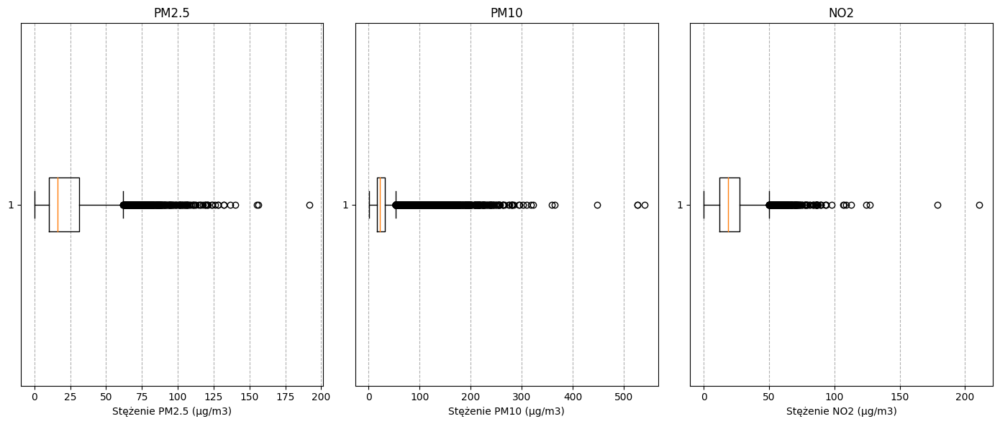

In [28]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
plt.boxplot(pm25_dane.dropna(), vert=False)
plt.title('PM2.5')
plt.xlabel('Stężenie PM2.5 (μg/m3)')
plt.grid(axis='x', linestyle='--')

plt.subplot(1, 3, 2)
plt.boxplot(pm10_dane.dropna(), vert=False)
plt.title('PM10')
plt.xlabel('Stężenie PM10 (μg/m3)')
plt.grid(axis='x', linestyle='--')

plt.subplot(1, 3, 3)
plt.boxplot(no2_dane.dropna(), vert=False)
plt.title('NO2')
plt.xlabel('Stężenie NO2 (μg/m3)')
plt.grid(axis='x', linestyle='--')

plt.tight_layout()
plt.show()


Na powyższych boxplotach, można zaobserwować największą koncentrację danych PM2.5, PM10 oraz NO2 w dolnych zakresach. Na każdym z wykresów występuje dużo outlierów, w PM10 wynoszących nawet ponad 500 μg/m3. Niestety wiadomo, że i takie pomiary są spotykane.

In [29]:
data[['PM10 (μg/m3)','Measurement Year', 'WHO Country Name']].sort_values(ascending = False, by = 'PM10 (μg/m3)')

,PM10 (μg/m3),Measurement Year,WHO Country Name
26231,540.0,2010-01-01,Pakistan
21089,526.5,2012-01-01,Iran (Islamic Republic of)
21088,526.5,2011-01-01,Iran (Islamic Republic of)
26233,448.0,2010-01-01,Pakistan
21111,365.1,2018-01-01,Iraq
...,...,...,...
20898,NaN,2020-01-01,Iran (Islamic Republic of)
24763,NaN,2020-01-01,Kuwait
32049,NaN,2020-01-01,South Africa
32047,NaN,2020-01-01,South Africa


Najwyższe wartości stężeń PM2.5 występują w Pakistanie, następnie w Iranie.

# REGION

In [30]:
region = data.groupby('WHO Region').mean()
print(region)

                              PM2.5 (μg/m3)  PM10 (μg/m3)  NO2 (μg/m3)  \
WHO Region                                                               
African Region                    27.257120     52.181203    22.893361   
Eastern Mediterranean Region      38.043045    121.317951    45.684595   
European Region                   14.008295     23.038029    20.371107   
Region of the Americas            11.383310     30.674819    15.726044   
South East Asia Region            42.815707     94.608512    22.097506   
Western Pacific Region            40.335577     32.588482    31.790546   

                              PM25 temporal coverage (%)  \
WHO Region                                                 
African Region                                 73.928272   
Eastern Mediterranean Region                   69.678132   
European Region                                93.935878   
Region of the Americas                         92.799218   
South East Asia Region                         

C:\Users\User\AppData\Local\Temp\ipykernel_3564\915441406.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  region = data.groupby('WHO Region').mean()


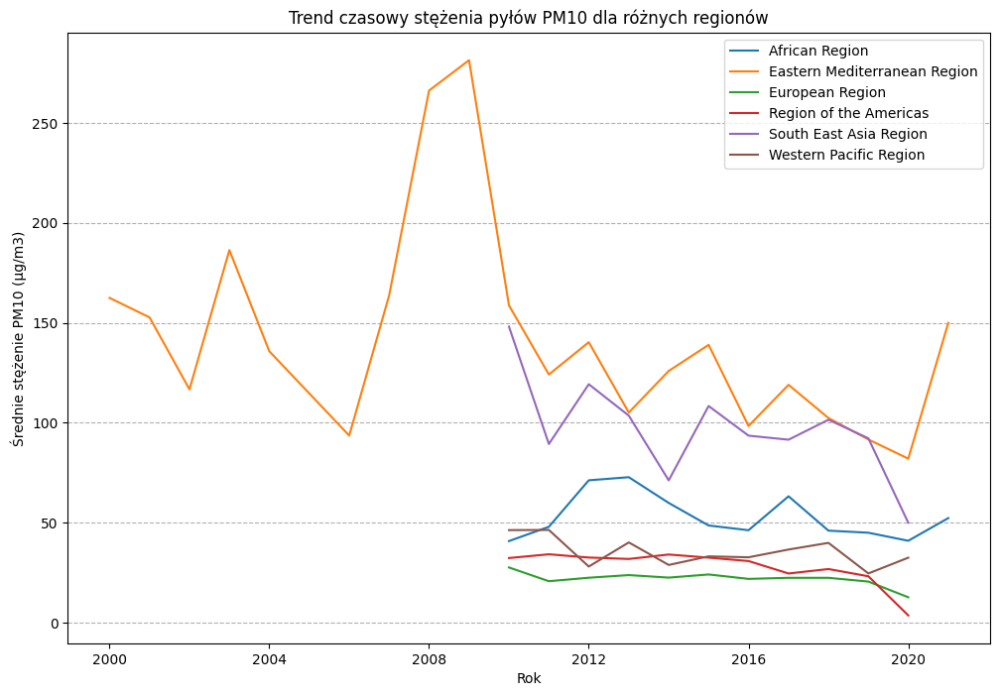

In [31]:
trend_data_region = data.groupby(['Measurement Year', 'WHO Region'])['PM10 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for region in trend_data_region.columns:
    plt.plot(trend_data_region.index, trend_data_region[region], label=region)

plt.title('Trend czasowy stężenia pyłów PM10 dla różnych regionów')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM10 (μg/m3)')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()


In [32]:
data[(data['Measurement Year'] >= '2000') & (data['Measurement Year'] < '2010')]['WHO Country Name'].unique()

array(['Bahrain'], dtype=object)

Jak można zaobserować pomiary od 2000 do 2009 roku są tylko dla 'Eastern Mediterranean Region' dla kraju 'Bahrain'. Dane te zawierają tylko pomiary stężeń PM10. Być może warto usunąć wartości sprzed 2010 roku, ponieważ mogą zaburzyć analizę dla regionów. Analogiczną sytuację obserwuje się po roku 2020, tym razem wartości posiada tylko 'African Region' oraz 'Eastern Mediterranean Region'.

In [33]:
data = data[(data['Measurement Year'] >= '2010-01-01') & (data['Measurement Year'] <= '2020-12-31')]

In [34]:
data

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%)
10859,European Region,DEU,Germany,Kassel,2010-01-01,16.81,24.75,37.59,99.452,99.7945,96.335500
26542,European Region,POL,Poland,Dabrowa Gornicza,2010-01-01,NaN,48.78,28.67,NaN,88.4930,94.726000
28523,European Region,ROU,Romania,Pitesti,2010-01-01,NaN,28.53,39.85,NaN,87.6710,78.116000
2126,Region of the Americas,BRA,Brazil,Araucaria,2010-01-01,NaN,26.70,36.47,NaN,NaN,NaN
18698,South East Asia Region,IND,India,Baddi,2010-01-01,NaN,NaN,16.33,NaN,NaN,59.935897
...,...,...,...,...,...,...,...,...,...,...,...
4546,European Region,CHE,Switzerland,Thun,2020-01-01,NaN,12.40,16.25,NaN,NaN,NaN
4620,European Region,CHE,Switzerland,Zürich,2020-01-01,9.85,13.30,23.78,NaN,NaN,NaN
4228,European Region,CHE,Switzerland,Meyrin,2020-01-01,8.60,13.90,12.40,NaN,NaN,NaN
2059,Region of the Americas,BHS,Bahamas,Nassau,2020-01-01,3.20,3.65,NaN,40.000,40.0000,NaN


C:\Users\User\AppData\Local\Temp\ipykernel_3564\903806943.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  region = data.groupby('WHO Region').mean()


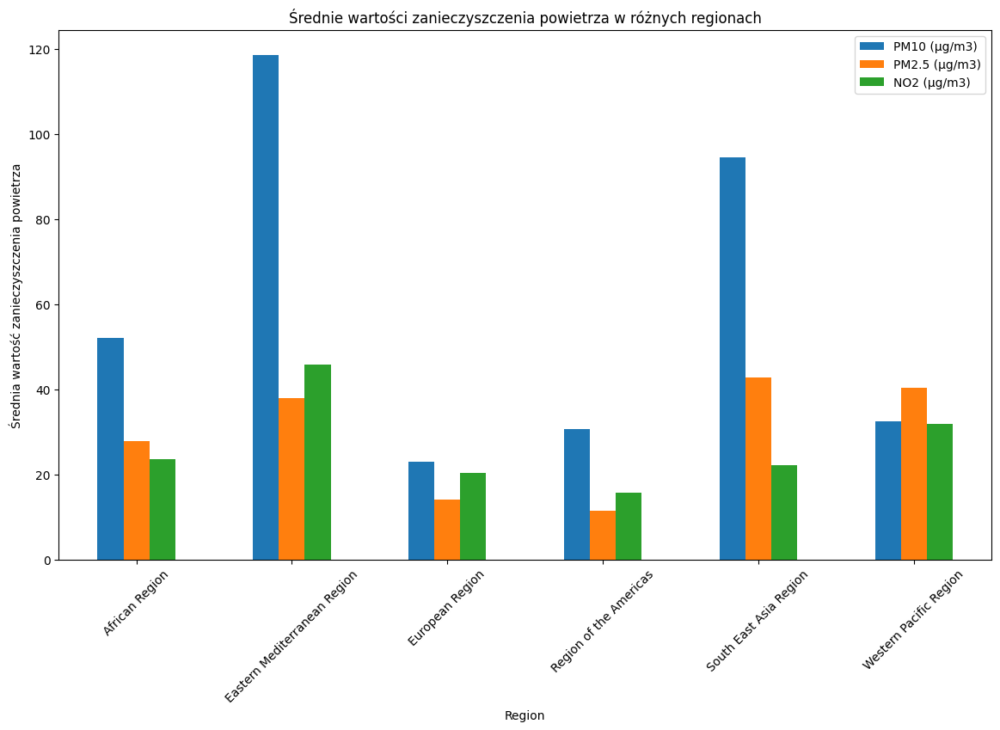

In [35]:
region = data.groupby('WHO Region').mean()
selected_columns = ['PM10 (μg/m3)', 'PM2.5 (μg/m3)', 'NO2 (μg/m3)']
region_selected = region[selected_columns]

region_selected.plot(kind='bar', figsize=(14, 8))
plt.title('Średnie wartości zanieczyszczenia powietrza w różnych regionach')
plt.xlabel('Region')
plt.ylabel('Średnia wartość zanieczyszczenia powietrza')
plt.xticks(rotation=45)
plt.show()


Można zaobserować, że największą średnią zanieczyszczeń PM10 oraz NO2 posiada 'Eastern Mediterranean Region', natomiast 'South East Asia Region' posiada największą średnią zanieczyszczeń dla PM2.5. Najlepiej na wykresie wypadają 'European Region' oraz 'Region of the Americas', które posiadają najmniejsze średnie zanieczyszczeń.

In [36]:
record_count_per_region = data.groupby('WHO Region').size()
print("Ilość rekordów dla posczególnych regionów:\n", record_count_per_region)

Ilość rekordów dla posczególnych regionów:
 WHO Region
African Region                    172
Eastern Mediterranean Region      415
European Region                 20212
Region of the Americas           3955
South East Asia Region           2513
Western Pacific Region           4786
dtype: int64


In [37]:
observations_per_region = data.groupby('WHO Region')[['PM10 (μg/m3)', 'PM2.5 (μg/m3)', 'NO2 (μg/m3)']].count()
print(observations_per_region)

                              PM10 (μg/m3)  PM2.5 (μg/m3)  NO2 (μg/m3)
WHO Region                                                            
African Region                         142            110          109
Eastern Mediterranean Region           266            219          147
European Region                      16203           7558        16881
Region of the Americas                2264           2118         2141
South East Asia Region                1418            552         2209
Western Pacific Region                 685           4436          604


Jednak ze względu na duże dysproporcje pomiędzy ilością pomiarów dla każdego z regionów oraz dla każdej z cząstek porównanie, który region wypada lepiej jest utrudnione. Najwięcej obserwacji posiada region Europy, podczas gdy region Afryki ma ponad 100 razy mniej obserwacji. 

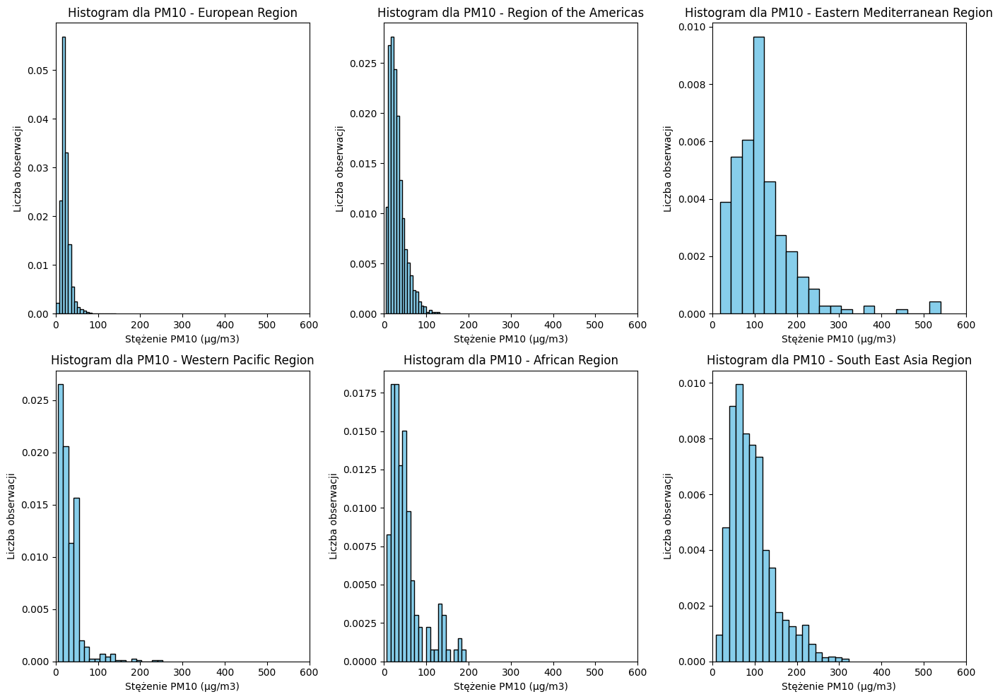

In [38]:
pm10_data = data[['WHO Region', 'PM10 (μg/m3)']].dropna()

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region in enumerate(pm10_data['WHO Region'].unique()):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region_data = pm10_data[pm10_data['WHO Region'] == region]['PM10 (μg/m3)']
    ax.hist(region_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'Histogram dla PM10 - {region}')
    ax.set_xlabel('Stężenie PM10 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0,600)
plt.tight_layout()
plt.show()


Po ustawieniu takiego samego zakresu osi 'x' dla każdego z regionów można zaobserować, że regiony 'European Region', 'Region of the Amercias', 'Western Pacific Region' mają małą rozpiętość wartości PM10 w porównaniu do pozostałych regionów, w szczególności 'Eastern Mediterranean Region' oraz 'South East Asia Region'.

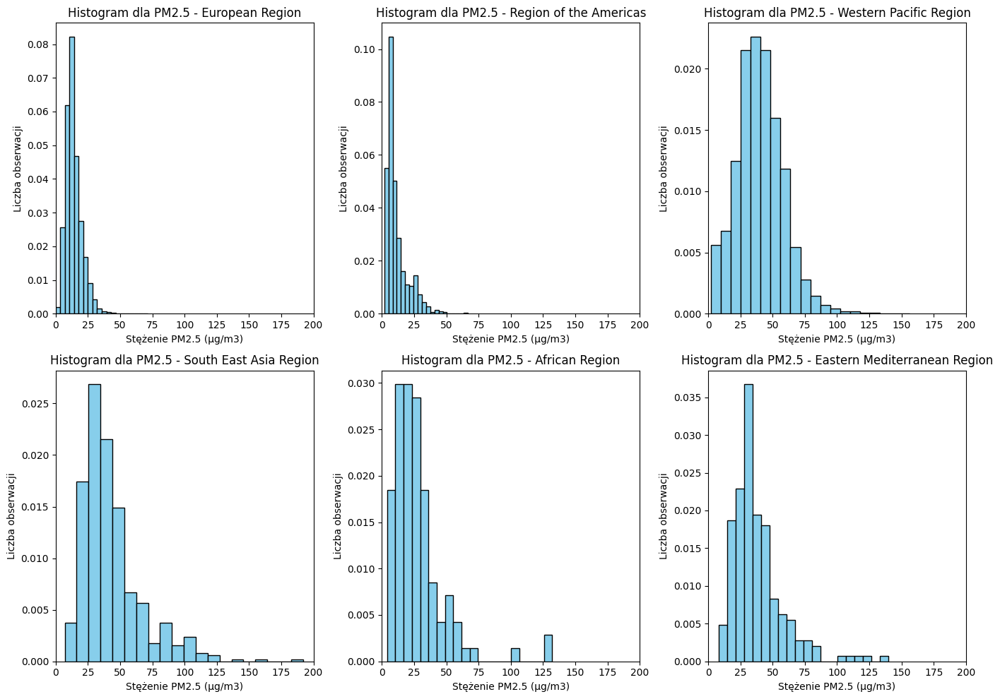

In [39]:
pm25_data = data[['WHO Region', 'PM2.5 (μg/m3)']].dropna()

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region in enumerate(pm25_data['WHO Region'].unique()):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region_data = pm25_data[pm25_data['WHO Region'] == region]['PM2.5 (μg/m3)']
    ax.hist(region_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'Histogram dla PM2.5 - {region}')
    ax.set_xlabel('Stężenie PM2.5 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0,200)

plt.tight_layout()
plt.show()

Najmniejszą rozpiętość wartości PM2.5 posiadają regiony 'European Region' oraz 'Region of the Americas', co się zgadza z wykresem przedstawiającym średnie wartości, gdzie te regiony też wypadały najlepiej.

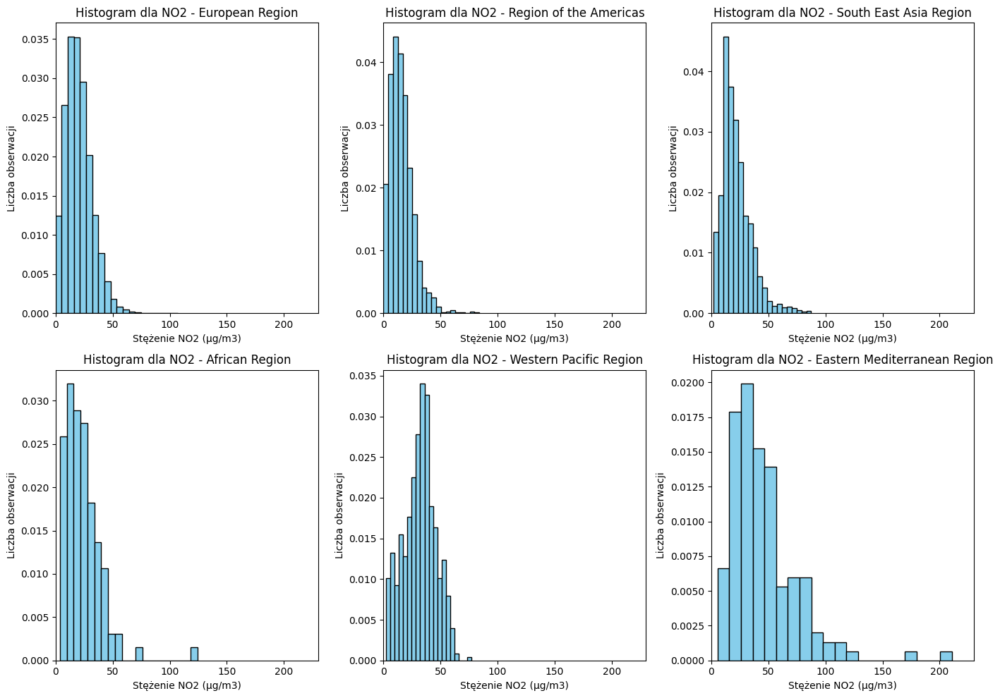

In [40]:
no2_data = data[['WHO Region', 'NO2 (μg/m3)']].dropna()

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region in enumerate(no2_data['WHO Region'].unique()):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region_data = no2_data[no2_data['WHO Region'] == region]['NO2 (μg/m3)']
    ax.hist(region_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'Histogram dla NO2 - {region}')
    ax.set_xlabel('Stężenie NO2 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0,230)
plt.tight_layout()
plt.show()

Różnice w stężeniu wartości NO2, choć najmniej widoczne to najgorzej wypada region 'Eastern Mediterranean Region'

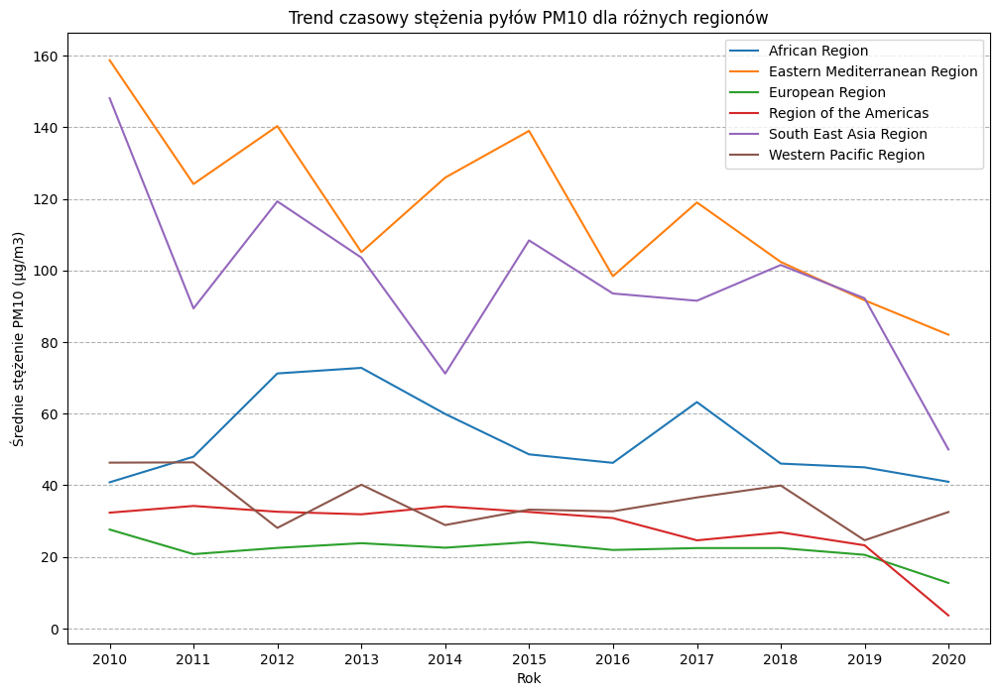

In [41]:
trend_data_region = data.groupby(['Measurement Year', 'WHO Region'])['PM10 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for region in trend_data_region.columns:
    plt.plot(trend_data_region.index, trend_data_region[region], label=region)

plt.title('Trend czasowy stężenia pyłów PM10 dla różnych regionów')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM10 (μg/m3)')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()

Dla każdego regionu obserowany jest spadek wartości stężeń PM2.5 od 2019 roku, być może jest to spowodowane wybuchem pandemii. Natomiast dla regionu 'Western Pacific Region' obserwuje się wzrost tych wartości. Dla dwóch najbardziej zanieczyszczonych regionów widać ogólny trend spadkowy. 'European Region' oraz 'Region of the Americas' utrzymują wartości na dosyć stałym poziomie. 

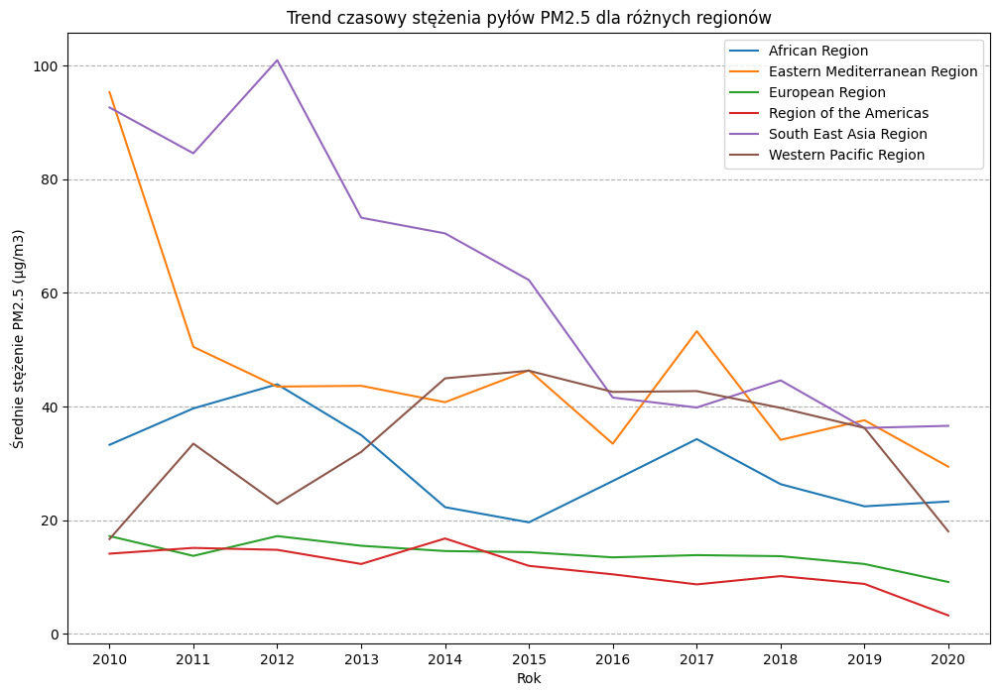

In [42]:
trend_data_region = data.groupby(['Measurement Year', 'WHO Region'])['PM2.5 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for region in trend_data_region.columns:
    plt.plot(trend_data_region.index, trend_data_region[region], label=region)

plt.title('Trend czasowy stężenia pyłów PM2.5 dla różnych regionów')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM2.5 (μg/m3)')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()

Dla stężenia PM2.5 obserwuje się delikatny wzrost dla regionów 'African Region' oraz 'South East Asia Region' oraz co ciekawe największy ze wszystkich spadek wartości dla 'Western Pacific Region', co trochę 'kłóci się' z logiką, ponieważ wartości PM10 wzrosły w tym okresie.

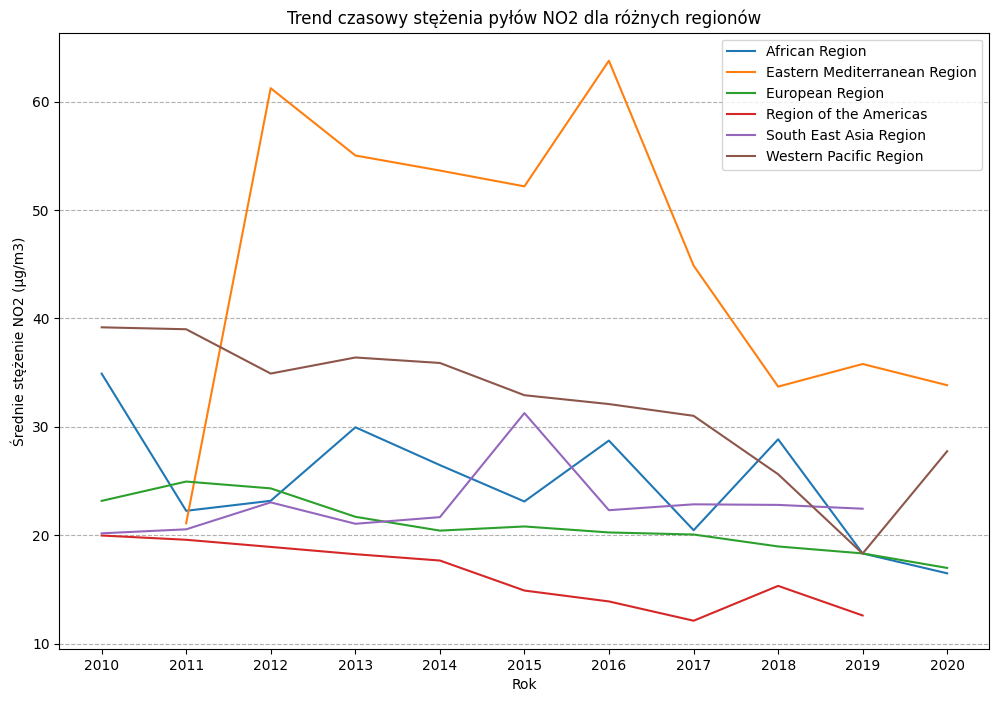

In [43]:
trend_data_region = data.groupby(['Measurement Year', 'WHO Region'])['NO2 (μg/m3)'].mean().unstack()
plt.figure(figsize=(12, 8))

for region in trend_data_region.columns:
    plt.plot(trend_data_region.index, trend_data_region[region], label=region)

plt.title('Trend czasowy stężenia pyłów NO2 dla różnych regionów')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie NO2 (μg/m3)')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()

Wartości NO2 nie zostały zmierzone dla dwóch regionów: 'Region of the Amercias' oraz 'South East Asia Region' po 2019 roku. Wartości dla regionu 'Eastern Mediterranean Region' nie są zmierzone przed 2011. Gwałtowny wzrost wartości obserwuje się w 2011-2012 roku dla 'Eastern Mediterranean Region'.

# KRAJ

In [44]:
kraj = data.groupby('WHO Country Name').mean()
print(kraj)

                                    PM2.5 (μg/m3)  PM10 (μg/m3)  NO2 (μg/m3)  \
WHO Country Name                                                               
Afghanistan                            119.770000           NaN          NaN   
Albania                                 19.372000     25.575000    20.325000   
Algeria                                 21.530000           NaN          NaN   
Andorra                                       NaN     25.701429    28.455714   
Argentina                               10.185000     26.010000    17.442500   
...                                           ...           ...          ...   
United States of America                 8.844305     19.933640    14.655616   
Uruguay                                 10.000000     22.415000          NaN   
Uzbekistan                              42.525000           NaN          NaN   
Venezuela (Bolivarian Republic of)      35.000000     47.000000          NaN   
Viet Nam                                

C:\Users\User\AppData\Local\Temp\ipykernel_3564\3960735141.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  kraj = data.groupby('WHO Country Name').mean()


In [45]:
data_pm10_notnull = data[data['PM10 (μg/m3)'].notnull()]

observations_by_region_country = data_pm10_notnull.groupby(['WHO Region', 'WHO Country Name']).size()
top_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(2)

print("2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:")
print(top_countries_by_region)

2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:
WHO Region                    WHO Country Name          
African Region                South Africa                   109
                              Mauritius                       11
Eastern Mediterranean Region  Iran (Islamic Republic of)      79
                              Kuwait                          55
European Region               Italy                         2612
                              Germany                       2052
Region of the Americas        United States of America      1044
                              Brazil                         460
South East Asia Region        India                         1197
                              Thailand                       107
Western Pacific Region        Australia                      215
                              Republic of Korea              181
dtype: int64


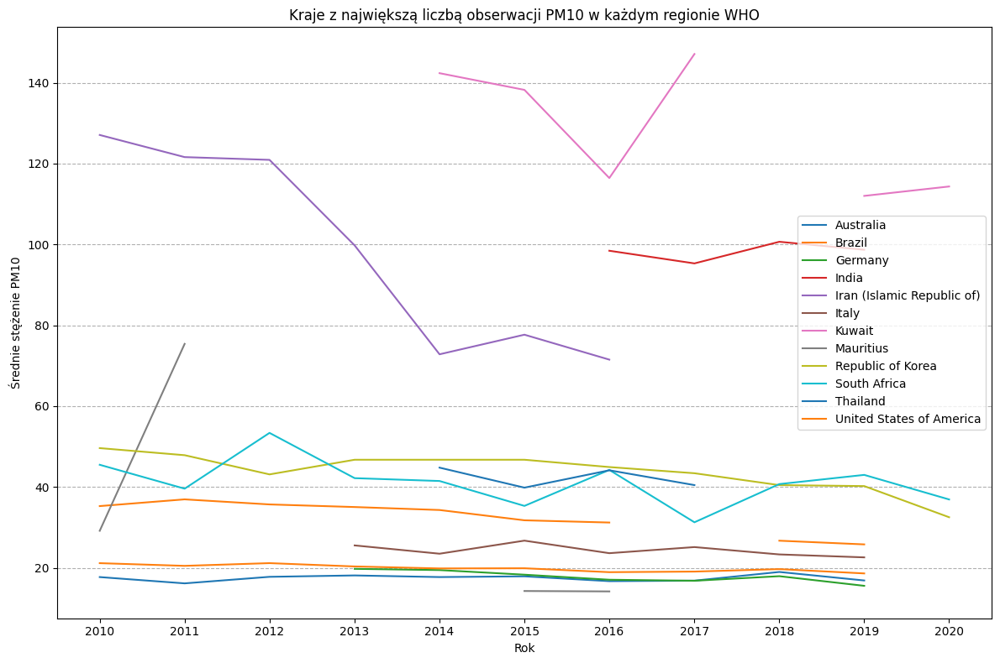

In [46]:
top_countries_list = top_countries_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'WHO Country Name'])['PM10 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for country in top_countries_list:
    if country in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[country], label=country)

plt.title('Kraje z największą liczbą obserwacji PM10 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM10')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()



Jak widać powyżej ciężko jest porównywać ze sobą kraje, ze względu na duże braki występujące w różnych okresach. Większość z wybranych wyżej krajów sytuuje się w dolnej części wykresu. Wyróżniają sie trzy kraje: Iran, Kuwejt oraz Indie. Pokrywa się to z stopniami zanieczyszczeń w granulacji regionalnej.

In [47]:
top1_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(1)

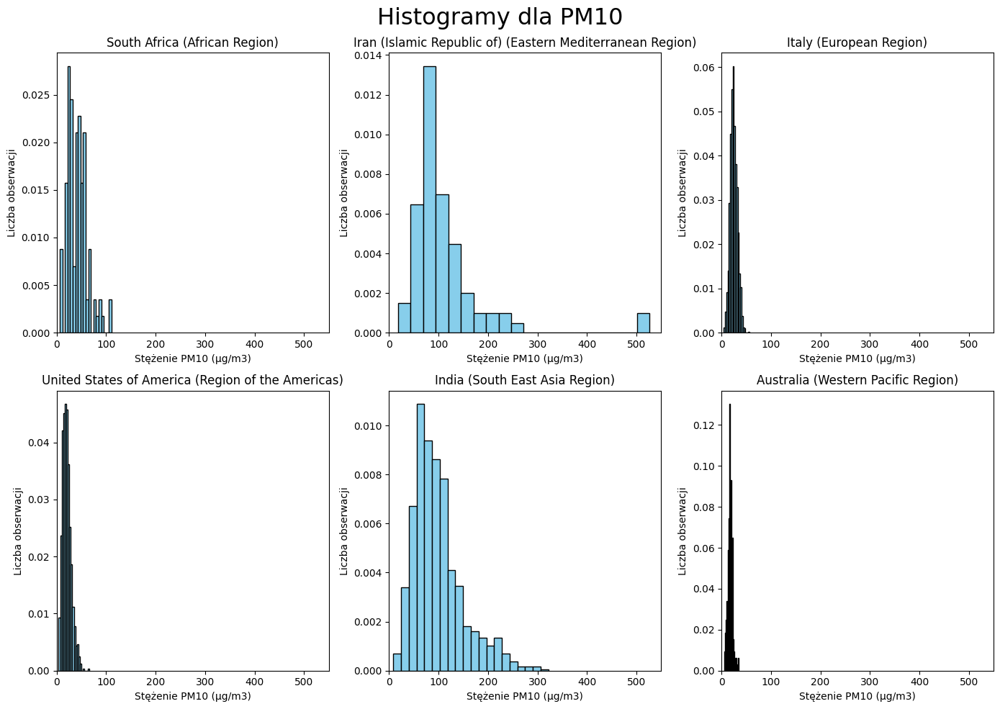

In [48]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region_country in enumerate(top1_countries_by_region.index):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region = region_country[0]
    country = region_country[1]
    region_country_data = data_pm10_notnull[(data_pm10_notnull['WHO Region'] == region) & (data_pm10_notnull['WHO Country Name'] == country)]['PM10 (μg/m3)']
    ax.hist(region_country_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'{country} ({region})')
    ax.set_xlabel('Stężenie PM10 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0, 550)
plt.suptitle('Histogramy dla PM10', fontsize = 23)
plt.tight_layout()
plt.show()

Dla stworzenia powyższych histogramów wybrano najbardziej zanieczyszczone miasta względem PM10 dla każdego z regionów po jednym. Zdecydowanie najmniejszą rozpiętość widać dla 'United States of America' oraz 'Italy'. 

In [49]:
data_pm25_notnull = data[data['PM2.5 (μg/m3)'].notnull()]

observations_by_region_country = data_pm25_notnull.groupby(['WHO Region', 'WHO Country Name']).size()
top_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(2)

print("2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:")
print(top_countries_by_region)

2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:
WHO Region                    WHO Country Name          
African Region                South Africa                    83
                              Senegal                          6
Eastern Mediterranean Region  Iran (Islamic Republic of)     140
                              Kuwait                          30
European Region               Italy                         1394
                              Germany                       1045
Region of the Americas        Canada                         918
                              United States of America       662
South East Asia Region        India                          421
                              Bangladesh                      59
Western Pacific Region        China                         3966
                              Australia                      169
dtype: int64


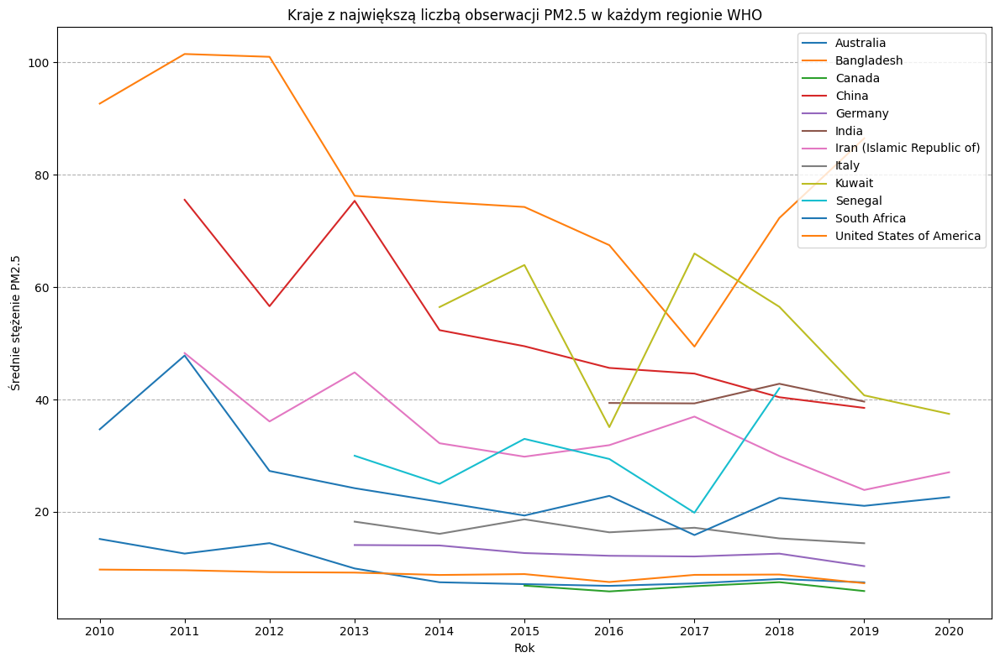

In [50]:
top_countries_list = top_countries_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'WHO Country Name'])['PM2.5 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for country in top_countries_list:
    if country in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[country], label=country)

plt.title('Kraje z największą liczbą obserwacji PM2.5 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM2.5')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

Widać, że obserwacje dla PM2.5 są bardziej ciągłe w porównaniu do PM10. Wartości nie są już tu aż tak skumulowane w dolnej części wykresu. Największe wartości stężeń PM2.5 są osiągane przez Bangladesh, Chiny oraz Kuwejt.

In [51]:
top1_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(1)

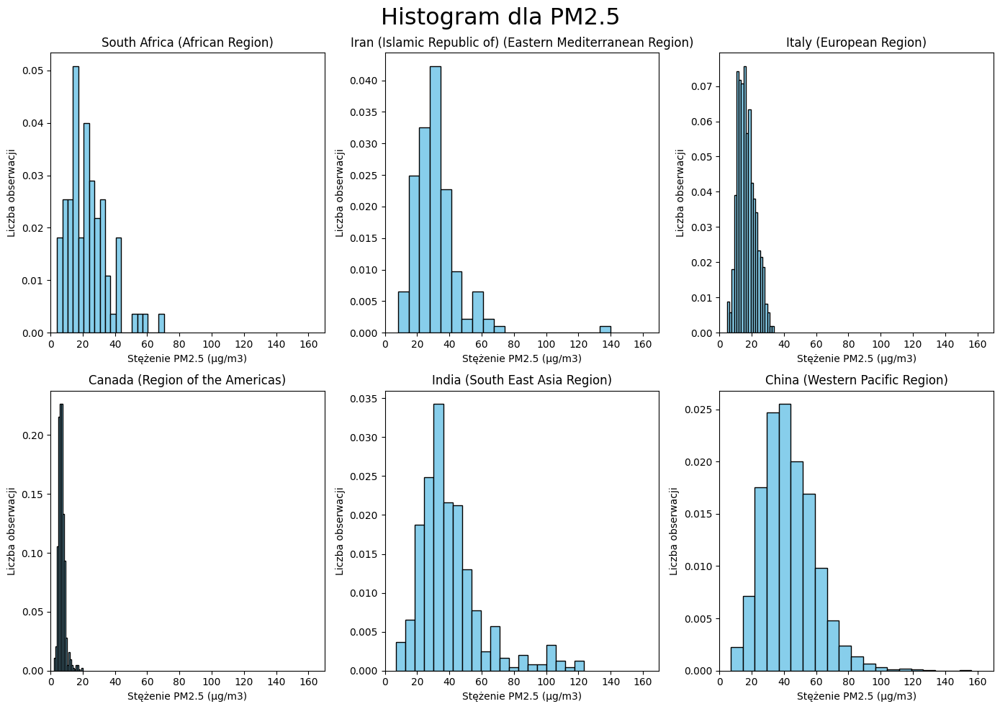

In [52]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region_country in enumerate(top1_countries_by_region.index):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region = region_country[0]
    country = region_country[1]
    region_country_data = data_pm25_notnull[(data_pm25_notnull['WHO Region'] == region) & (data_pm25_notnull['WHO Country Name'] == country)]['PM2.5 (μg/m3)']
    ax.hist(region_country_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'{country} ({region})')
    ax.set_xlabel('Stężenie PM2.5 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0,170)
plt.suptitle('Histogram dla PM2.5', fontsize = 23)

plt.tight_layout()
plt.show()

Najbardziej skumulowane wartości są dla 'Canada' oraz 'Italy', znów z regionów 'European Region' i 'Region of the Americas'. Największe wartości dla 'Canada' są najmniejszymi obserwowanymi dla 'India', 'China' oraz dla 'Iran (Islamic Republic of)'. 

In [53]:
data_no2_notnull = data[data['NO2 (μg/m3)'].notnull()]

observations_by_region_country = data_no2_notnull.groupby(['WHO Region', 'WHO Country Name']).size()
top_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(2)

print("2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:")
print(top_countries_by_region)

2 kraje posiadające najwięcej obserwacji w każdym regionie WHO:
WHO Region                    WHO Country Name          
African Region                South Africa                    98
                              Senegal                         10
Eastern Mediterranean Region  Iran (Islamic Republic of)      41
                              United Arab Emirates            36
European Region               Italy                         2971
                              Germany                       2413
Region of the Americas        United States of America       933
                              Canada                         657
South East Asia Region        India                         2131
                              Thailand                        38
Western Pacific Region        China                          285
                              Republic of Korea              181
dtype: int64


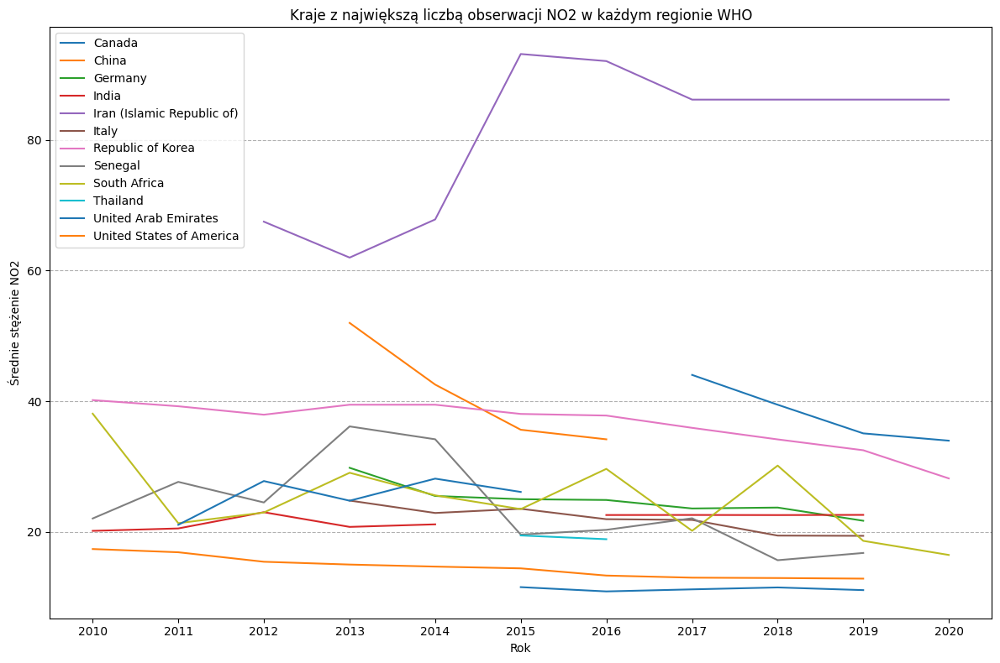

In [54]:
top_countries_list = top_countries_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'WHO Country Name'])['NO2 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for country in top_countries_list:
    if country in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[country], label=country)

plt.title('Kraje z największą liczbą obserwacji NO2 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie NO2')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

Od razu widać, że 'Iran (Islamic Republic of)' posiada najwyższe wartości stężeń NO2. Reszta wartości jest skumulowana w okolicach 10-40 μg/m3.

In [55]:
top1_countries_by_region = observations_by_region_country.groupby('WHO Region', group_keys=False).nlargest(1)

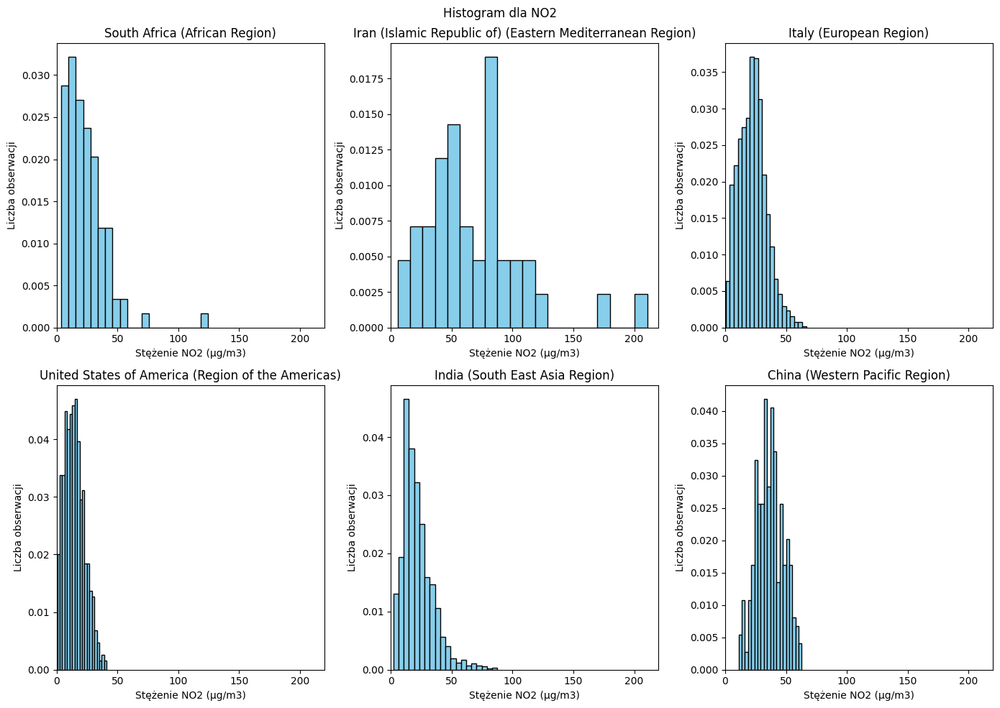

In [56]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(14, 10))

for i, region_country in enumerate(top1_countries_by_region.index):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    region = region_country[0]
    country = region_country[1]
    region_country_data = data_no2_notnull[(data_no2_notnull['WHO Region'] == region) & (data_no2_notnull['WHO Country Name'] == country)]['NO2 (μg/m3)']
    ax.hist(region_country_data, bins=20, color='skyblue', edgecolor='black', density = True)
    ax.set_title(f'{country} ({region})')
    ax.set_xlabel('Stężenie NO2 (μg/m3)')
    ax.set_ylabel('Liczba obserwacji')
    ax.set_xlim(0, 220)
plt.suptitle('Histogram dla NO2')
plt.tight_layout()
plt.show()

Sczególnie wyróżnia się spośród powyższych histogramów ten dla 'Iran (Islamic Republic of)'. Są tam osiągane najwyższe poziomy stężeń NO2, reszta jest do siebie całkiem zbliżona.

In [57]:
data_pm10_notnull = data[data['PM10 (μg/m3)'].notnull()]
observations_by_country_year = data_pm10_notnull.groupby(['WHO Country Name', 'Measurement Year']).size()
observations_by_country_year
num_years = len(data_pm10_notnull['Measurement Year'].unique())

countries_with_all_years = observations_by_country_year.groupby('WHO Country Name').filter(lambda x: len(x) == num_years)
countries_with_all_years = countries_with_all_years.index.get_level_values('WHO Country Name').unique()

print("Kraje posiadające obserwacje dla każdego roku:")
print(countries_with_all_years)


Kraje posiadające obserwacje dla każdego roku:
Index(['Republic of Korea', 'South Africa', 'Switzerland'], dtype='object', name='WHO Country Name')


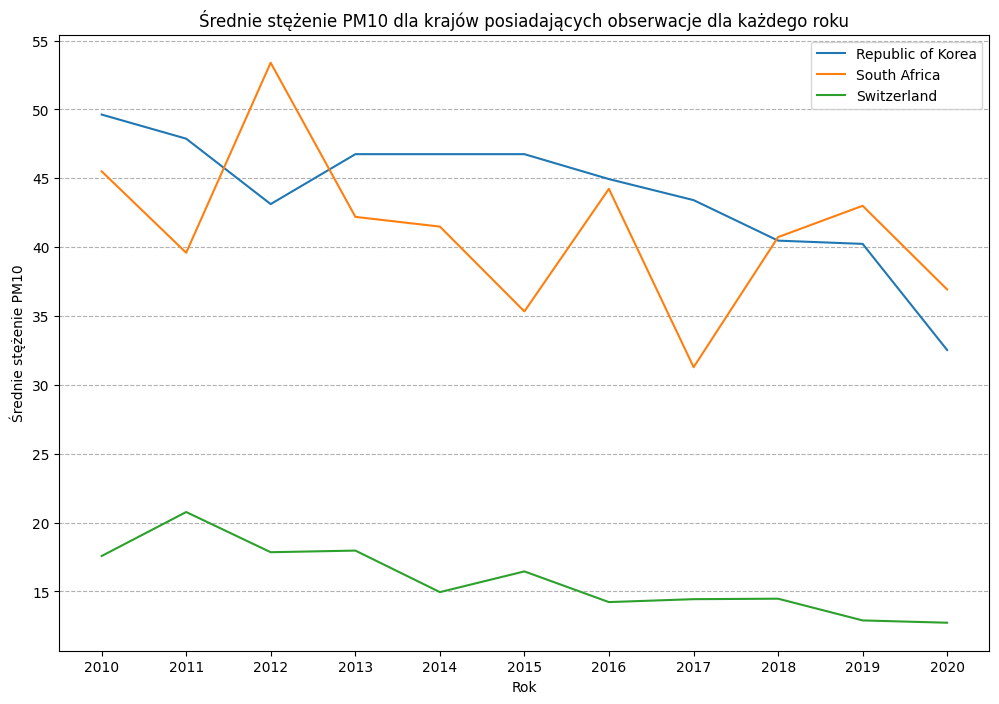

In [58]:
trend_data_region = data_pm10_notnull.groupby(['Measurement Year', 'WHO Country Name'])['PM10 (μg/m3)'].mean().unstack()
trend_data_region_filtered = trend_data_region[trend_data_region.columns.intersection(countries_with_all_years)]
trend_data_region_filtered
plt.figure(figsize=(12, 8))

for country in trend_data_region_filtered.columns:
    plt.plot(trend_data_region_filtered.index, trend_data_region_filtered[country], label=country)

plt.title('Średnie stężenie PM10 dla krajów posiadających obserwacje dla każdego roku')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM10')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()


Znaleziono trzy kraje, które zawierają obserwacje stężeń PM10 dla lat 2010-2020. Dwa z nich usytuuowane są w górnej części wykresu - 'Republic of Korea' oraz 'South Africa'. W dolnej części wykresu znajduje się 'Switzerland'. Po 2019 roku widać ogólną tendencję do spadku wartości stężeń PM10.

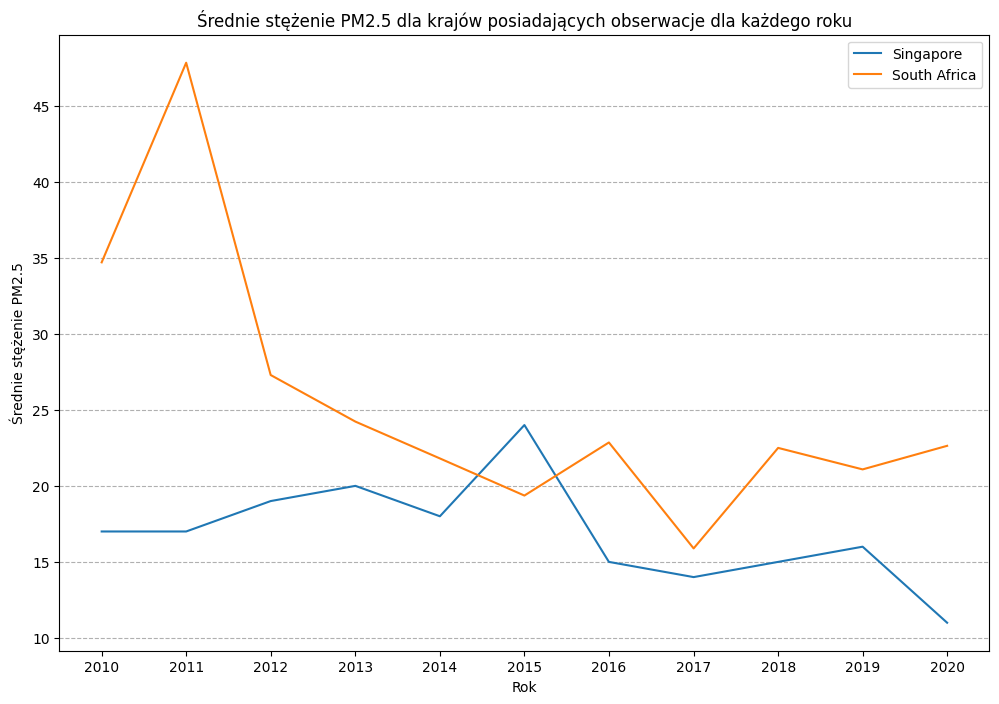

In [59]:
trend_data_region = data_pm25_notnull.groupby(['Measurement Year', 'WHO Country Name'])['PM2.5 (μg/m3)'].mean().unstack()

num_years = len(data_pm25_notnull['Measurement Year'].unique())
observations_by_country_year = data_pm25_notnull.groupby(['WHO Country Name', 'Measurement Year']).size()

countries_with_all_years = observations_by_country_year.groupby('WHO Country Name').filter(lambda x: len(x) == num_years)
countries_with_all_years = countries_with_all_years.index.get_level_values('WHO Country Name').unique()
trend_data_region_filtered = trend_data_region[trend_data_region.columns.intersection(countries_with_all_years)]
# trend_data_region_filtered
plt.figure(figsize=(12, 8))

for country in trend_data_region_filtered.columns:
    plt.plot(trend_data_region_filtered.index, trend_data_region_filtered[country], label=country)

plt.title('Średnie stężenie PM2.5 dla krajów posiadających obserwacje dla każdego roku')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM2.5')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()

Dla stężeń PM2.5 w latach 2010-2020 znaleziono tylko dwa kraje z danymi z każdego roku. Dla 'South Africa' widoczny jest duży spadek względem pierwszych obserwacji.  

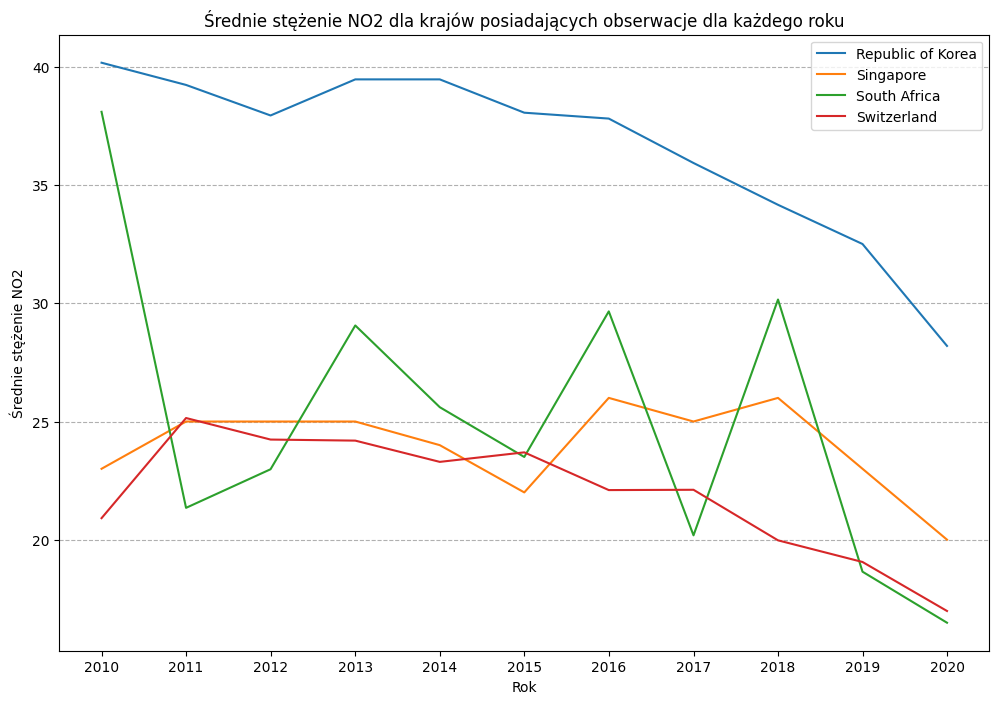

In [60]:
trend_data_region = data_no2_notnull.groupby(['Measurement Year', 'WHO Country Name'])['NO2 (μg/m3)'].mean().unstack()

num_years = len(data_no2_notnull['Measurement Year'].unique())
observations_by_country_year = data_no2_notnull.groupby(['WHO Country Name', 'Measurement Year']).size()

countries_with_all_years = observations_by_country_year.groupby('WHO Country Name').filter(lambda x: len(x) == num_years)
countries_with_all_years = countries_with_all_years.index.get_level_values('WHO Country Name').unique()
trend_data_region_filtered = trend_data_region[trend_data_region.columns.intersection(countries_with_all_years)]
# trend_data_region_filtered
plt.figure(figsize=(12, 8))

for country in trend_data_region_filtered.columns:
    plt.plot(trend_data_region_filtered.index, trend_data_region_filtered[country], label=country)

plt.title('Średnie stężenie NO2 dla krajów posiadających obserwacje dla każdego roku')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie NO2')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.show()

Najwięcej krajów posiadających wartości od 2010 do 2020 roku znaleziono dla stężeń NO2. 'Singapore', 'South Africa' oraz 'Switzerland' są skumulowane na wykresie. 'Republic of Korea' osiąga największe wartości, jednak z widonczym trendem spadkowym, który można zaobserwować dla każdego z krajów po 2018 roku.

# MIASTO

In [61]:
miasto = data.groupby('City or Locality').mean()
print(miasto)

                  PM2.5 (μg/m3)  PM10 (μg/m3)  NO2 (μg/m3)  \
City or Locality                                             
A Coruna                 14.125     25.647143    21.651429   
Aachen                      NaN     20.781429    36.453750   
Aadorf                      NaN     13.068571    12.450000   
Aalborg                  11.504           NaN    15.030000   
Aalen                       NaN     16.998750    21.748571   
...                         ...           ...          ...   
Šiauliai                    NaN     21.650000    21.006667   
Šumperk                  14.990     18.870000    17.530000   
Ţeţchea                     NaN           NaN    16.395000   
Žacleř                      NaN           NaN    13.660000   
Živinice                 61.280           NaN          NaN   

                  PM25 temporal coverage (%)  PM10 temporal coverage (%)  \
City or Locality                                                           
A Coruna                                 

C:\Users\User\AppData\Local\Temp\ipykernel_3564\858559042.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  miasto = data.groupby('City or Locality').mean()


In [62]:
observations_by_region_city = data_pm10_notnull.groupby(['WHO Region', 'City or Locality']).size()
top_cities_by_region = observations_by_region_city.groupby('WHO Region', group_keys=False).nlargest(2)

print("3 miasta posiadające najwięcej obserwacji w każdym regionie:")
print(top_cities_by_region)

3 miasta posiadające najwięcej obserwacji w każdym regionie:
WHO Region                    City or Locality 
African Region                Gert Sibande         11
                              Waterberg            10
Eastern Mediterranean Region  Abu Dhabi             9
                              Tehran                7
European Region               Bratislava           15
                              Montana              13
Region of the Americas        Lima                 11
                              Albuquerque (Nm)     10
South East Asia Region        Chittagong            9
                              Dhaka                 8
Western Pacific Region        Busan                11
                              Chungcheongbuk-Do    11
dtype: int64


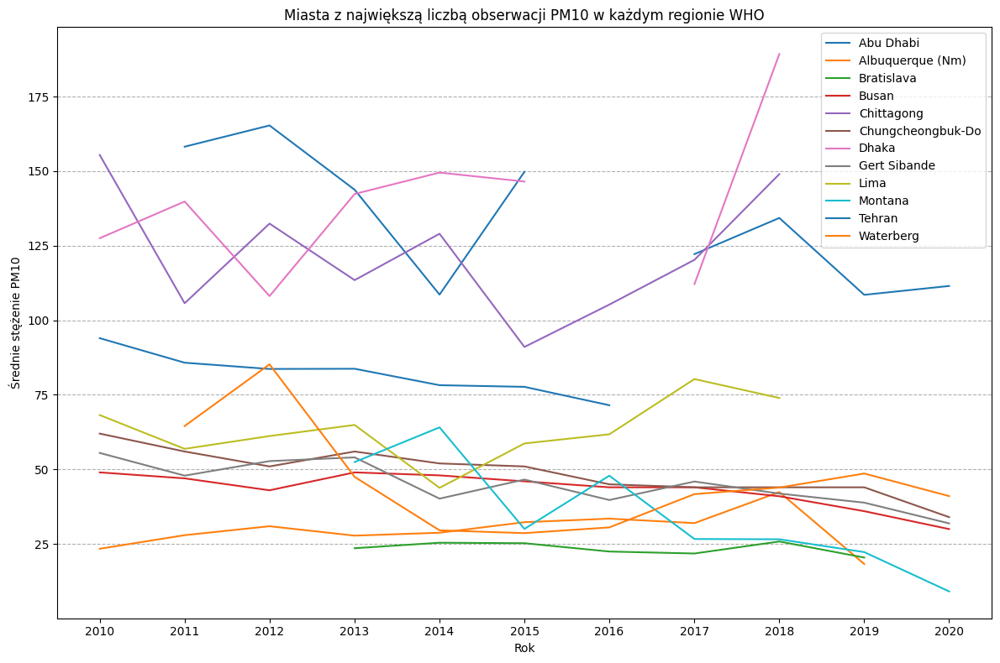

In [63]:
top_cities_list = top_cities_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'City or Locality'])['PM10 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for city in top_cities_list:
    if city in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[city], label=city)

plt.title('Miasta z największą liczbą obserwacji PM10 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM10')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

Największe wartości stężeń PM10 są osiągane w miastach 'Tehran', 'Dhaka' oraz 'Chittagong', co się pokrywa z zanieczyszczeniami regionalnymi.

In [64]:
observations_by_region_city = data_pm25_notnull.groupby(['WHO Region', 'City or Locality']).size()
top_cities_by_region = observations_by_region_city.groupby('WHO Region', group_keys=False).nlargest(2)

print("3 miasta posiadające najwięcej obserwacji w każdym regionie:")
print(top_cities_by_region)

3 miasta posiadające najwięcej obserwacji w każdym regionie:
WHO Region                    City or Locality
African Region                Gert Sibande        11
                              Waterberg           10
Eastern Mediterranean Region  Tehran               9
                              Esfahan              8
European Region               Alcorcon            10
                              Barcelona           10
Region of the Americas        Anchorage (Ak)      10
                              Bakersfield (Ca)    10
South East Asia Region        Dhaka               10
                              Chittagong           9
Western Pacific Region        Singapore           11
                              Darwin              10
dtype: int64


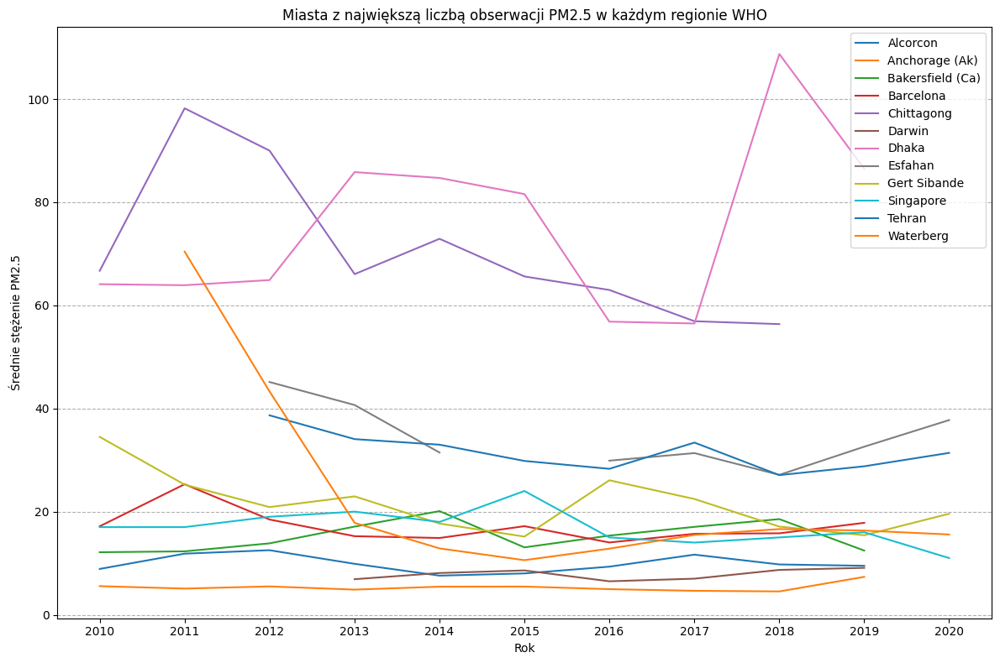

In [65]:
top_cities_list = top_cities_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'City or Locality'])['PM2.5 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for city in top_cities_list:
    if city in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[city], label=city)

plt.title('Miasta z największą liczbą obserwacji PM2.5 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie PM2.5')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

Podobnie jak dla PM10 najwyższe wartości stężeń PM2.5 osiągane są dla miast 'Dhaka' oraz 'Chittagong'.

In [66]:
observations_by_region_city = data_no2_notnull.groupby(['WHO Region', 'City or Locality']).size()
top_cities_by_region = observations_by_region_city.groupby('WHO Region', group_keys=False).nlargest(2)

print("3 miasta posiadające najwięcej obserwacji w każdym regionie:")
print(top_cities_by_region)

3 miasta posiadające najwięcej obserwacji w każdym regionie:
WHO Region                    City or Locality 
African Region                Gert Sibande         11
                              Dakar                10
Eastern Mediterranean Region  Abu Dhabi             9
                              Orumye                6
European Region               Bratislava           15
                              Avully               11
Region of the Americas        Bakersfield (Ca)     10
                              Baton Rouge (La)     10
South East Asia Region        Agra                  9
                              Ahmedabad             9
Western Pacific Region        Busan                11
                              Chungcheongbuk-Do    11
dtype: int64


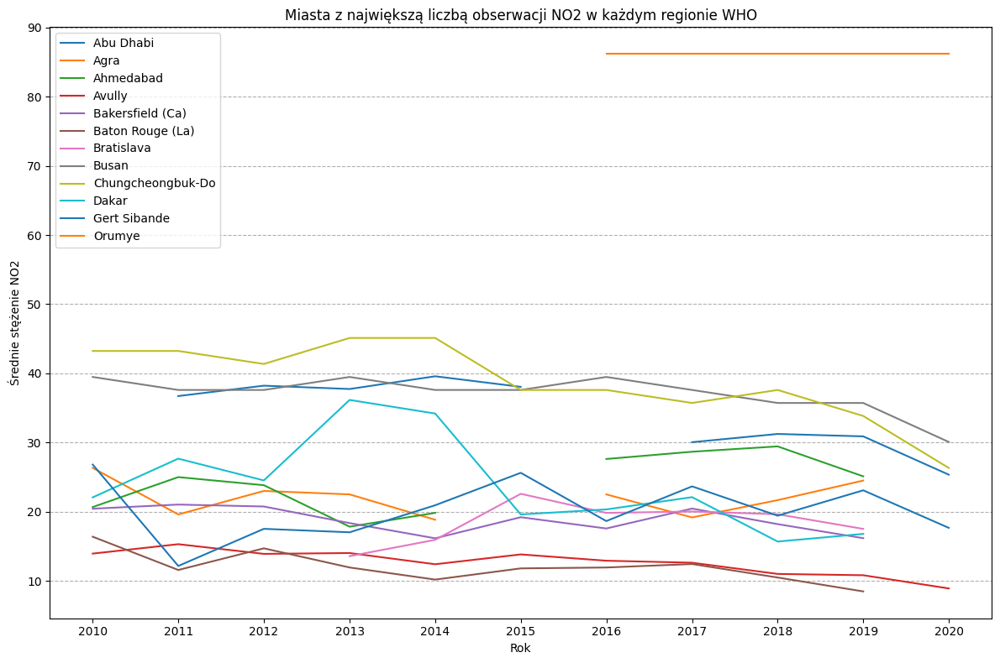

In [67]:
top_cities_list = top_cities_by_region.index.levels[1].tolist()
trend_data_region = data.groupby(['Measurement Year', 'City or Locality'])['NO2 (μg/m3)'].mean().unstack()

plt.figure(figsize=(12, 8))

for city in top_cities_list:
    if city in trend_data_region.columns:
        plt.plot(trend_data_region.index, trend_data_region[city], label=city)

plt.title('Miasta z największą liczbą obserwacji NO2 w każdym regionie WHO')
plt.xlabel('Rok')
plt.ylabel('Średnie stężenie NO2')
plt.grid(axis='y', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

Zdecydowanie najbardziej wyróżnia się miasto 'Orumye', zawierające najwyższe wartości stężeń NO2, dwa razy większe od największych wartości z reszty miast.

### MAPA

In [68]:
fig = px.choropleth(data, locations='ISO3', color='PM2.5 (μg/m3)', hover_name='WHO Country Name',
                    projection='natural earth', title='Średnie stężenia PM2.5', animation_frame = data['Measurement Year'].dt.year)
fig.show()

In [69]:
fig = px.choropleth(data, locations='ISO3', color='PM10 (μg/m3)', hover_name='WHO Country Name',
                    projection='natural earth', title='Średnie stężenia PM10', animation_frame = data['Measurement Year'].dt.year)
fig.show()

In [70]:
fig = px.choropleth(data, locations='ISO3', color='NO2 (μg/m3)', hover_name='WHO Country Name',
                    projection='natural earth', title='Średnie stężenia NO2', animation_frame = data['Measurement Year'].dt.year)
fig.show()

### PODSUMOWANIE

-najłatwiej było wykonać analizę na poziomie regionów, ponieważ dla miast oraz krajów występowały duże braki w danych i ciężko było znależć miasta/kraje posiadające ciągłość w danych dla tych samych okresów,

-najmniej zanieczyszczonymi regionami są 'European Region' oraz 'Region of the Americas',

-bardzo mało obserwacji występowało od 2000 do 2010 roku, z tego powodu zdecydowano się wykluczyć z analizy te lata oraz okres od 2020 do 2022 roku,

-widać możliwy wpływ pandemii COVID-19 na wartości PM, od 2019 roku w większości przypadków wartości stężeń ulegają spadkowi,
-obserwuje się silną korelację między PM10 oraz PM2.5,

-na każdym poziomie generalizacji widoczna jest obserwacja, że najmniej zanieczyszczonymi regionami są'European Region' oraz 'Region of the Americas',

-regiony najbardziej rozwinięte są najmniej zanieczyszczone,

-przez duże ilości braków możliwości wykorzystania danych w ML są ograniczone, można zobaczyć ogólne trendy długoterminowe, nawet nie wiemy z jakiego miesiąca pochodzą dane, dla niektórych rejonów mogłyby zostać użyte do predykcji przyszłych wartości, 

-dla najmniej zanieczyszconych regionów jest najmniejsza amplituda wartości oraz liczba pomiarów jest zdecydowanie największa, co najlepiej widać porównując ilość pomiarów dla Afryki oraz Europy.

